In [1]:
#Load Libraries
import pandas as pd
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt # plotting
import os # accessing directory structure
import math


## Geethu Vijayan 100902183

# Data1_Game_Goalie_Stats

In [2]:
# Load Data
df1 = pd.read_csv('/Users/geethuvishnu/Desktop/AI_SECONDSEM/2000_Applied _machine_learning/nhl_data/game_goalie_stats.csv')

In [3]:
# Pandas Profiling
from pandas_profiling import ProfileReport

/var/folders/5r/bcv1cq312633kzxwxm4ypj_00000gn/T/ipykernel_2861/2274191625.py:1: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  from pandas_profiling import ProfileReport


In [4]:
profile = ProfileReport(df1, title="Pandas Profiling Report", explorative=True)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [5]:
df1.shape

(56656, 19)

In [28]:
#Descriptive Statistics
df1.describe()

,game_id,player_id,team_id,timeOnIce,assists,goals,pim,shots,saves,powerPlaySaves,shortHandedSaves,evenSaves,shortHandedShotsAgainst,evenShotsAgainst,powerPlayShotsAgainst,savePercentage,powerPlaySavePercentage,evenStrengthSavePercentage
count,5.665600e+04,5.665600e+04,56656.000000,56656.000000,56656.000000,56656.000000,56656.000000,56656.000000,56656.000000,56656.000000,56656.000000,56656.000000,56656.000000,56656.000000,56656.000000,56517.000000,51913.000000,56459.000000
mean,2.010748e+09,8.468184e+06,16.902146,3369.154564,0.021075,0.000159,0.085851,27.684235,25.203562,4.078032,0.776529,20.342965,0.850925,22.133313,4.693589,90.112653,84.258532,91.039223
std,6.068775e+06,7.417587e+03,11.235659,734.192491,0.145223,0.012603,0.610103,8.825602,8.650819,3.201827,1.046156,7.577797,1.105461,7.757074,3.435020,7.798010,22.668988,8.253391
min,2.000020e+09,8.445275e+06,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2.006020e+09,8.462055e+06,8.000000,3525.000000,0.000000,0.000000,0.000000,23.000000,20.000000,2.000000,0.000000,16.000000,0.000000,17.000000,2.000000,87.096774,75.000000,87.500000
50%,2.011021e+09,8.470320e+06,16.000000,3598.000000,0.000000,0.000000,0.000000,28.000000,26.000000,4.000000,0.000000,21.000000,1.000000,22.000000,4.000000,91.428571,92.857143,92.307692
75%,2.016021e+09,8.473607e+06,24.000000,3600.000000,0.000000,0.000000,0.000000,33.000000,31.000000,6.000000,1.000000,25.000000,1.000000,27.000000,7.000000,95.000000,100.000000,96.153846
max,2.019041e+09,8.480925e+06,90.000000,9027.000000,2.000000,1.000000,29.000000,88.000000,85.000000,25.000000,15.000000,76.000000,15.000000,79.000000,28.000000,100.000000,100.000000,100.000000


In [29]:
df1.isna().sum()

game_id                          0
player_id                        0
team_id                          0
timeOnIce                        0
assists                          0
goals                            0
pim                              0
shots                            0
saves                            0
powerPlaySaves                   0
shortHandedSaves                 0
evenSaves                        0
shortHandedShotsAgainst          0
evenShotsAgainst                 0
powerPlayShotsAgainst            0
decision                      4102
savePercentage                 139
powerPlaySavePercentage       4743
evenStrengthSavePercentage     197
dtype: int64

In [6]:
def plotPerColumnDistribution(df1, nGraphShown, nGraphPerRow):
    nunique = df1.nunique()
    df1 = df1[[col for col in df1 if nunique[col] > 1 and nunique[col] < 50]]  # For displaying purposes, pick columns that have between 1 and 50 unique values
    nRow, nCol = df1.shape
    columnNames = list(df1)
    nGraphRow = math.ceil((nCol + nGraphPerRow - 1) / nGraphPerRow)
    
    plt.figure(figsize=(6 * nGraphPerRow, 8 * nGraphRow), dpi=80, facecolor='w', edgecolor='k')
    
    for i in range(min(nCol, nGraphShown)):
        plt.subplot(nGraphRow, nGraphPerRow, i + 1)
        columnDf = df1.iloc[:, i]
        if not np.issubdtype(columnDf.dtype, np.number):
            valueCounts = columnDf.value_counts()
            valueCounts.plot.bar()
        else:
            columnDf.hist()
        plt.ylabel('Counts')
        plt.xticks(rotation=90)
        plt.title(f'{columnNames[i]} (column {i})')
    
    plt.tight_layout(pad=1.0, w_pad=1.0, h_pad=1.0)
    plt.show()

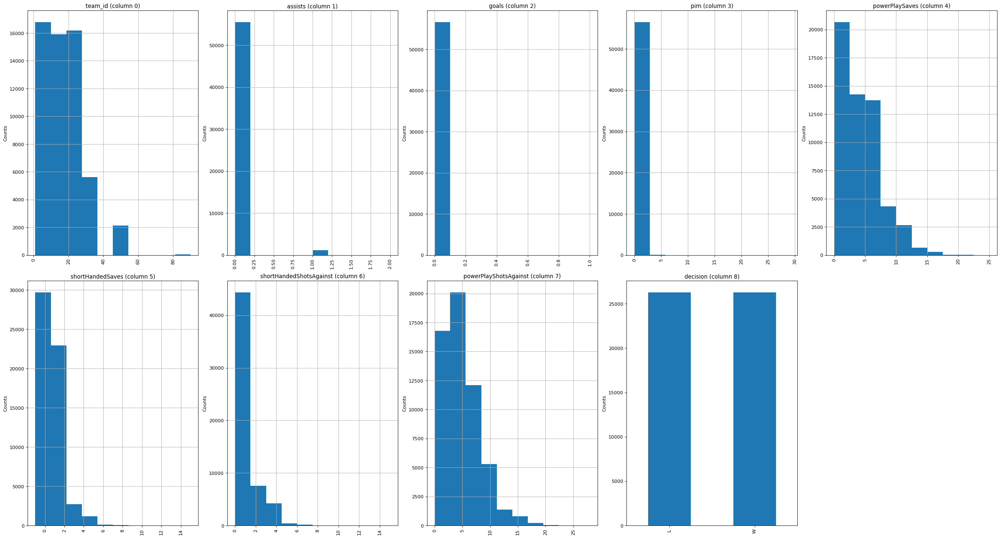

In [7]:
plotPerColumnDistribution(df1, nGraphShown=10, nGraphPerRow=5)

In [8]:
def plotCorrelationMatrix(df1, graphWidth, title="Correlation Matrix"):
    df1 = df1.dropna(axis=1)  # drop columns with NaN
    df1 = df1[[col for col in df1 if df1[col].nunique() > 1]]  # keep columns where there are more than 1 unique values
    if df1.shape[1] < 2:
        print(f'No correlation plots shown: The number of non-NaN or constant columns ({df.shape[1]}) is less than 2')
        return
    corr = df1.corr()
    plt.figure(figsize=(graphWidth, graphWidth), dpi=80, facecolor='w', edgecolor='k')
    corrMat = plt.matshow(corr, fignum=1)
    plt.xticks(range(len(corr.columns)), corr.columns, rotation=90)
    plt.yticks(range(len(corr.columns)), corr.columns)
    plt.gca().xaxis.tick_bottom()
    plt.colorbar(corrMat)
    plt.title(title, fontsize=15)
    plt.show()

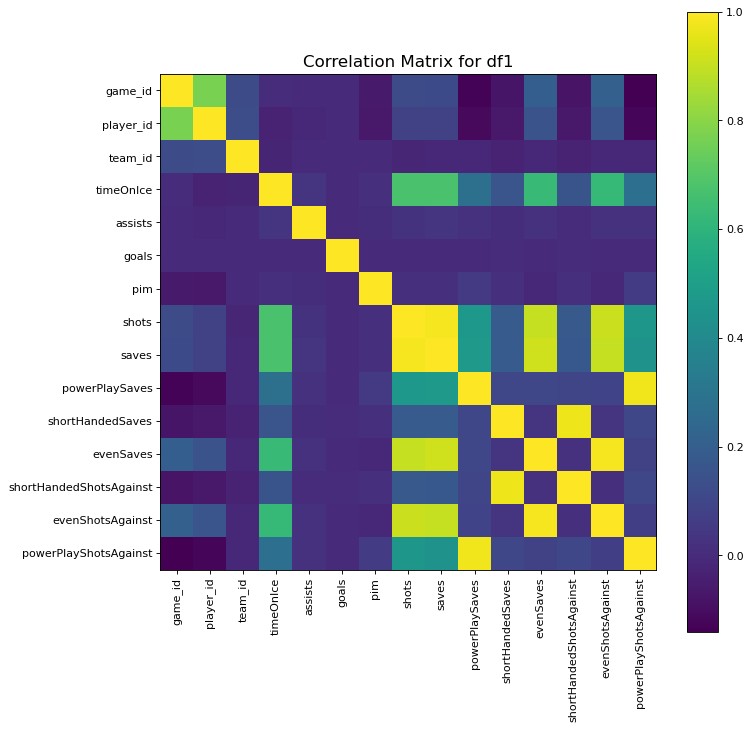

In [9]:
plotCorrelationMatrix(df1, graphWidth=10, title="Correlation Matrix for df1")

In [10]:
# Scatter and density plots
def plotScatterMatrix(df1, plotSize, textSize):
    df1 = df1.select_dtypes(include =[np.number]) # keep only numerical columns
    # Remove rows and columns that would lead to df being singular
    df1 = df1.dropna('columns')
    df1 = df1[[col for col in df1 if df1[col].nunique() > 1]] # keep columns where there are more than 1 unique values
    columnNames = list(df1)
    if len(columnNames) > 10: # reduce the number of columns for matrix inversion of kernel density plots
        columnNames = columnNames[:10]
    df1 = df1[columnNames]
    ax = pd.plotting.scatter_matrix(df1, alpha=0.75, figsize=[plotSize, plotSize], diagonal='kde')
    corrs = df1.corr().values
    for i, j in zip(*plt.np.triu_indices_from(ax, k = 1)):
        ax[i, j].annotate('Corr. coef = %.3f' % corrs[i, j], (0.8, 0.2), xycoords='axes fraction', ha='center', va='center', size=textSize)
    plt.suptitle('Scatter and Density Plot')
    plt.show()

/var/folders/5r/bcv1cq312633kzxwxm4ypj_00000gn/T/ipykernel_2861/19898813.py:5: FutureWarning: In a future version of pandas all arguments of DataFrame.dropna will be keyword-only.
  df1 = df1.dropna('columns')


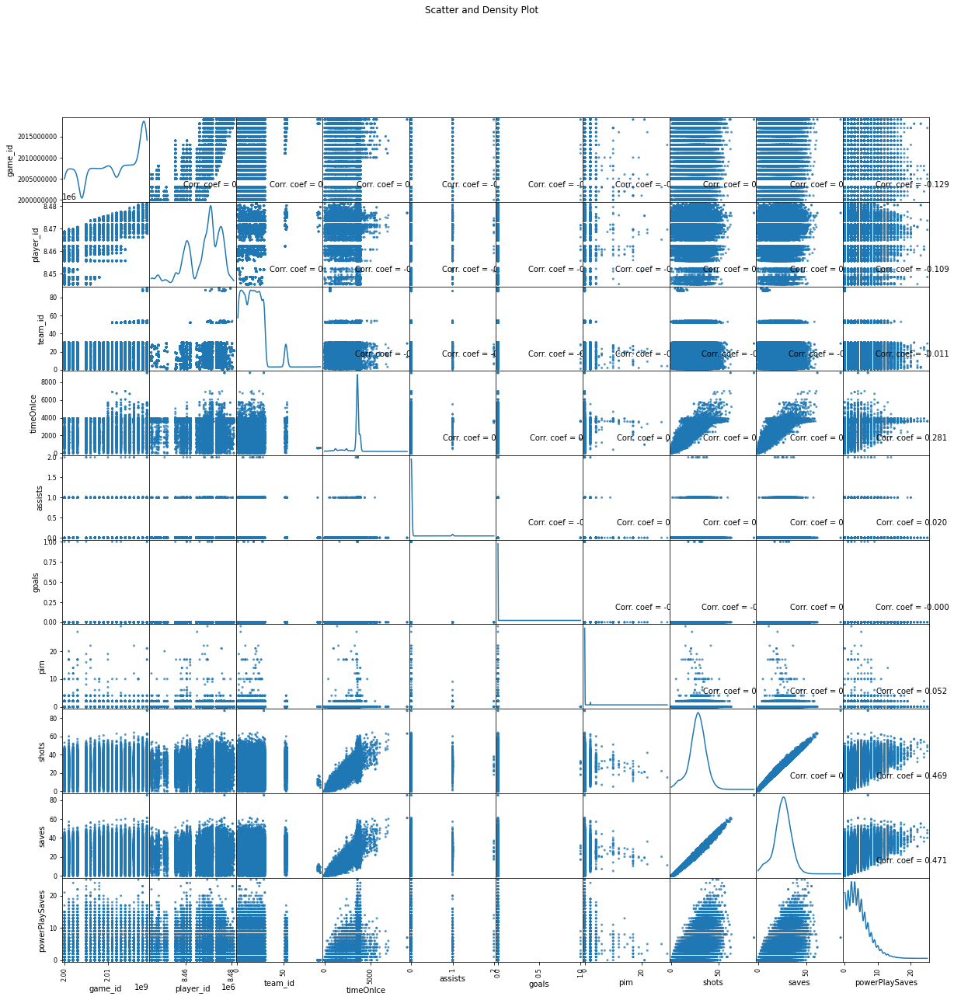

In [11]:
plotScatterMatrix(df1, 20, 10)

In [12]:
df2 = pd.read_csv('/Users/geethuvishnu/Desktop/AI_SECONDSEM/2000_Applied _machine_learning/nhl_data/game_goals.csv')

/var/folders/5r/bcv1cq312633kzxwxm4ypj_00000gn/T/ipykernel_2861/3163968494.py:1: DtypeWarning: Columns (2) have mixed types. Specify dtype option on import or set low_memory=False.
  df2 = pd.read_csv('/Users/geethuvishnu/Desktop/AI_SECONDSEM/2000_Applied _machine_learning/nhl_data/game_goals.csv')


In [13]:
df3 = pd.read_csv('/Users/geethuvishnu/Desktop/AI_SECONDSEM/2000_Applied _machine_learning/nhl_data/game_officials.csv')

In [14]:
df4 = pd.read_csv('/Users/geethuvishnu/Desktop/AI_SECONDSEM/2000_Applied _machine_learning/nhl_data/game_penalties.csv')

# DATA5_ Game_Penalities

In [16]:
df5 = pd.read_csv('/Users/geethuvishnu/Desktop/AI_SECONDSEM/2000_Applied _machine_learning/nhl_data/game_penalties.csv')

In [18]:
df5.head()

,play_id,penaltySeverity,penaltyMinutes
0,2016020045_41,Minor,2
1,2016020045_101,Minor,2
2,2016020045_134,Minor,2
3,2016020045_174,Minor,2
4,2016020045_189,Minor,2


In [19]:
df5.shape

(247828, 3)

In [20]:
profile = ProfileReport(df5, title="Pandas Profiling Report", explorative=True)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [21]:
df5.columns

Index(['play_id', 'penaltySeverity', 'penaltyMinutes'], dtype='object')

In [23]:
df5.describe()

,penaltyMinutes
count,247828.000000
mean,2.454408
std,1.459002
min,0.000000
25%,2.000000
50%,2.000000
75%,2.000000
max,10.000000


In [27]:
df5.isna().sum()

play_id                 0
penaltySeverity    127529
penaltyMinutes          0
dtype: int64

*  There are 247,828 records of penalties, which suggests a substantial dataset.

* The average penalty minutes awarded is approximately 2.45 minutes per penalty.

* The standard deviation of 1.46 minutes indicates a moderate spread around the mean, showing variability in the severity of penalties.

* The minimum penalty minutes awarded is 0, indicating that there are instances where no penalty minutes were given.

* 75% of the penalties are at least 2 minutes long, as indicated by the 25th percentile also being 2 minutes.

* The median penalty time is 2 minutes, suggesting that the most common penalty duration given is 2 minutes.

* Similarly, even the 75th percentile is at 2 minutes, reinforcing that the majority of penalties are for 2 minutes.

* The maximum penalty minutes given is 10 minutes, which would be considered a major penalty affecting the game significantly.

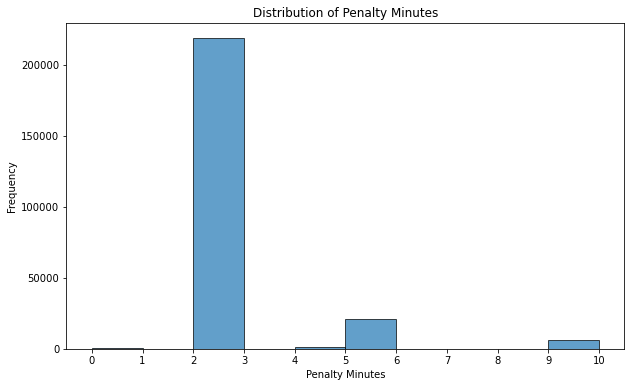

In [31]:
# Histogram to show the distribution of penalty minutes
plt.figure(figsize=(10, 6))
plt.hist(df5['penaltyMinutes'], bins=range(0, 11), edgecolor='black', alpha=0.7)
plt.title('Distribution of Penalty Minutes')
plt.xlabel('Penalty Minutes')
plt.ylabel('Frequency')
plt.xticks(range(0, 11))
plt.show()

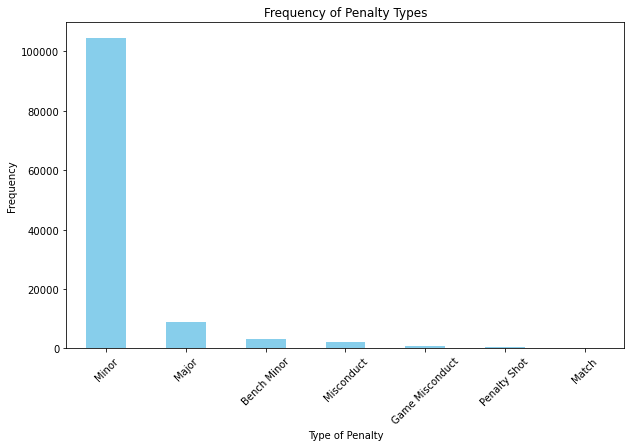

In [33]:
# Bar chart to show the frequency of different types of penalties
penalty_counts = df5['penaltySeverity'].value_counts()
plt.figure(figsize=(10, 6))
penalty_counts.plot(kind='bar', color='skyblue')
plt.title('Frequency of Penalty Types')
plt.xlabel('Type of Penalty')
plt.ylabel('Frequency')
plt.xticks(rotation=45)
plt.show()

In [ ]:
df6 = pd.read_csv('/Users/geethuvishnu/Desktop/AI_SECONDSEM/2000_Applied _machine_learning/nhl_data/game_plays.csv')

In [ ]:
df7 = pd.read_csv('/Users/geethuvishnu/Desktop/AI_SECONDSEM/2000_Applied _machine_learning/nhl_data/game_scratches.csv')

In [ ]:
df8 = pd.read_csv('/Users/geethuvishnu/Desktop/AI_SECONDSEM/2000_Applied _machine_learning/nhl_data/game_shifts.csv')

In [ ]:
df9 = pd.read_csv('/Users/geethuvishnu/Desktop/AI_SECONDSEM/2000_Applied _machine_learning/nhl_data/game_skater_stats.csv')

In [ ]:
df10 = pd.read_csv('/Users/geethuvishnu/Desktop/AI_SECONDSEM/2000_Applied _machine_learning/nhl_data/game_teams_stats.csv')

In [ ]:
df11 = pd.read_csv('/Users/geethuvishnu/Desktop/AI_SECONDSEM/2000_Applied _machine_learning/nhl_data/game.csv')

In [ ]:
df12 = pd.read_csv('/Users/geethuvishnu/Desktop/AI_SECONDSEM/2000_Applied _machine_learning/nhl_data/player_info.csv')

In [ ]:
df13 = pd.read_csv('/Users/geethuvishnu/Desktop/AI_SECONDSEM/2000_Applied _machine_learning/nhl_data/team_info.csv')

In [ ]:
combined_df = pd.concat([df1, df2, df3, df4, df5, df6, df7, df8, df9, df10, df11, df12, df13], axis=1)

In [ ]:
combined_df.head()

In [ ]:
combined_df.shape

In [ ]:
combined_df.info()

In [ ]:
combined_df.columns